# Setup and Import

In [2]:
import os
import random
import time

import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Conv2D, Dense, Dropout, Flatten, MaxPool2D
from tensorflow.keras.losses import (
    CategoricalCrossentropy,
    SparseCategoricalCrossentropy,
)
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator,
    img_to_array,
    load_img,
)

In [3]:
class_names = ["buildings", "forest", "glacier", "mountain", "sea", "street"]

# Functions

In [27]:
def img_split(
    class_names=None,
    shuffle=True,
    batch_size=116,
    validation_split=0.2,
    im_height=150,
    im_width=150,
    seed= None,
):
    if seed is None:
        seed= random.randint(1,1e6)
    cwd = os.getcwd()
    fpath = cwd + "//Data Set//Data//"
    if class_names is None:
        class_names = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
    datagen = ImageDataGenerator(rescale=1.0 / 255, validation_split=validation_split)

    train_generator = datagen.flow_from_directory(
        directory=fpath,
        target_size=(im_height, im_width),
        classes=class_names,
        color_mode="rgb",
        class_mode="categorical",
        batch_size=batch_size,
        shuffle=shuffle,
        subset="training",
        seed = seed
    )
    test_generator = datagen.flow_from_directory(
        directory=fpath,
        target_size=(im_height, im_width),
        classes=class_names,
        color_mode="rgb",
        class_mode="categorical",
        batch_size=batch_size,
        shuffle=shuffle,
        subset="validation",
        seed = seed * 2
    )
    return train_generator, test_generator

In [5]:
# Instantiate and compile a CNN model with fixed architecture and specified paramters
def CNN_model(
    parameter_list,
    hidden_nodes=100,
    dropout_rate=0,
    l_rate=0.0001,
    im_height=150,
    im_width=150,
    num_outputs=6,
):
    # Extract parameters from parameter_list
    channels_1 = parameter_list[0]
    window_1 = parameter_list[1]
    stride_1 = parameter_list[2]
    pool_window_1 = parameter_list[3]
    pool_stride_1 = parameter_list[4]
    channels_2 = parameter_list[5]
    window_2 = parameter_list[6]
    stride_2 = parameter_list[7]
    pool_window_2 = parameter_list[8]
    pool_stride_2 = parameter_list[9]

    # Instantiate and define model
    model = Sequential()
    model.add(
        Conv2D(  # first convolution layer
            filters=channels_1,
            kernel_size=window_1,
            strides=stride_1,
            padding="valid",
            activation="relu",
            input_shape=(im_height, im_width, 3),
        )
    )
    model.add(
        MaxPool2D(  # first max pool layer
            pool_size=pool_window_1, strides=pool_stride_1,
        )
    )
    model.add(
        Conv2D(  # second convolution layer
            filters=channels_2,
            kernel_size=window_2,
            strides=stride_2,
            padding="valid",
            activation="relu",
            input_shape=(im_height, im_width, 3),
        )
    )
    model.add(
        MaxPool2D(  # second max pool layer
            pool_size=pool_window_2, strides=pool_stride_2,
        )
    )
    model.add(Flatten())  # MLP section
    model.add(Dense(units=hidden_nodes, activation="relu"))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=num_outputs, activation="softmax"))

    # compile model
    loss_fn = CategoricalCrossentropy()
    gd_opt = Adam(learning_rate=l_rate)
    model.compile(loss=loss_fn, optimizer=gd_opt, metrics=["accuracy"])

    return model

In [6]:
# Fit a model over specified number of epochs
def CNN_fit(
    model,
    num_epochs=200,
    batch_size=116,
    verbose=0,
    class_names=["buildings", "forest", "glacier", "mountain", "sea", "street"],
):
    st = time.time()
    cwd = os.getcwd()
    checkpoint_path = (
        cwd + "//Callbacks//" + str(round(st)) + "_" + "weights.{epoch}.h5"
    )
    checkpoint_dir = os.path.dirname(checkpoint_path)
    cp_callback = ModelCheckpoint(
        checkpoint_path,
        verbose=0,
        save_weights_only=False,
        save_best_only=False,
        save_freq="epoch",
        mode="auto",
    )
    # Make the train_test split
    train, test = img_split(class_names=class_names)
    history = model.fit(
        train,
        epochs=num_epochs,
        verbose=verbose,
        validation_data=test,
        callbacks=[cp_callback],
    )
    print("Model name:", str(round(st)))
    print(time.time() - st)
    # Return loss history
    return history

In [7]:
def CNN_load(param, hidden_nodes, model_name, opt_epoch, num_outputs=6):
    # get optimal model directory
    cwd = os.getcwd()
    model_path = (
        cwd + "\\Callbacks\\" + model_name + "_weights." + str(opt_epoch) + ".h5"
    )

    # Generate a new model
    model = CNN_model(param, hidden_nodes, num_outputs=num_outputs)
    # Get optimal epoch weights
    model.load_weights(model_path)

    return model

In [8]:
# Once an optimal m*) has been Generate confusion matrix for optimal model
def CNN_confmat(
    param,
    hidden_nodes,
    model_name,
    opt_epoch,
    class_names=["buildings", "forest", "glacier", "mountain", "sea", "street"],
    num_outputs=6,
    batch_size=116,
):
    # Get optimal model
    model = CNN_load(
        param, hidden_nodes, model_name, opt_epoch, num_outputs=num_outputs
    )
    # Make the train_test split
    train, test = img_split(class_names=class_names, shuffle=False)
    # Make predictions on training and testing data
    train_pred = np.argmax(model.predict(train, batch_size=batch_size), axis=1)
    test_pred = np.argmax(model.predict(test, batch_size=batch_size), axis=1)
    # Compute accuracy of predictions
    train_act = train.labels
    test_act = test.labels
    train_conf_mat = confusion_matrix(train_act, train_pred, normalize="true")
    test_conf_mat = confusion_matrix(test_act, test_pred, normalize="true")

    return train_conf_mat, test_conf_mat

In [9]:
def conf_mat_view(
    conf_mat,
    name,
    class_names=["buildings", "forest", "glacier", "mountain", "sea", "street"],
):
    title = "Architecture " + name
    conf_mat = pd.DataFrame(conf_mat, columns=class_names, index=class_names)
    sns.heatmap(
        conf_mat,
        vmin=0.0,
        vmax=1.0,
        annot=True,
        linewidths=3,
        linecolor="w",
        fmt=".0%",
        cmap="Blues",
        square=True,
    )
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.show()

In [10]:
def cl_img_split(
    class_name, batch_size=1000, im_height=150, im_width=150,
):
    cwd = os.getcwd()
    fpath = cwd + "//Data Set//Data//"
    datagen = ImageDataGenerator(rescale=1.0 / 255)

    im_generator = datagen.flow_from_directory(
        classes=class_name,
        directory=fpath,
        target_size=(im_height, im_width),
        color_mode="rgb",
        class_mode="categorical",
        batch_size=batch_size,
        shuffle=False,
    )
    return im_generator

In [11]:
def generate_flattened_layer_outputs(param, h, name, best_epoch, cl):
    # load optimal model
    opt_model = CNN_load(param, h, name, best_epoch)
    # print(opt_model.summary())

    layer_names = list()

    for layer in opt_model.layers:
        layer_names.append(layer.name)

    flat_layer_name = layer_names[4]
    intermediate_layer_model = keras.Model(
        inputs=opt_model.input, outputs=opt_model.get_layer(flat_layer_name).output
    )

    im_object = cl_img_split([cl])
    batches = [
        im_object[x][0] for x in range(im_object.samples // im_object.batch_size + 1)
    ]
    for idx, batch in enumerate(batches):
        print(batch.shape)
        output = intermediate_layer_model(batch)
        output_df = pd.DataFrame(output)
        output_df.to_csv(str(cl) + str(idx) + "_flattened_output.csv")

In [12]:
def collect_flattened_layer_outputs(rel_dir="\\Flat2\\"):
    cwd = os.getcwd()
    flat_dir = cwd + rel_dir

    CL0 = pd.read_csv(flat_dir + "buildings0_flattened_output.csv").drop(
        "Unnamed: 0", axis=1
    )
    CL0 = pd.concat(
        [
            CL0,
            pd.read_csv(flat_dir + "buildings1_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    CL0 = pd.concat(
        [
            CL0,
            pd.read_csv(flat_dir + "buildings2_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )

    CL1 = pd.read_csv(flat_dir + "forest0_flattened_output.csv").drop(
        "Unnamed: 0", axis=1
    )
    CL1 = pd.concat(
        [
            CL1,
            pd.read_csv(flat_dir + "forest1_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    CL1 = pd.concat(
        [
            CL1,
            pd.read_csv(flat_dir + "forest2_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )

    CL2 = pd.read_csv(flat_dir + "glacier0_flattened_output.csv").drop(
        "Unnamed: 0", axis=1
    )
    CL2 = pd.concat(
        [
            CL2,
            pd.read_csv(flat_dir + "glacier1_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    CL2 = pd.concat(
        [
            CL2,
            pd.read_csv(flat_dir + "glacier2_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )

    CL3 = pd.read_csv(flat_dir + "mountain0_flattened_output.csv").drop(
        "Unnamed: 0", axis=1
    )
    CL3 = pd.concat(
        [
            CL3,
            pd.read_csv(flat_dir + "mountain1_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    CL3 = pd.concat(
        [
            CL3,
            pd.read_csv(flat_dir + "mountain2_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )

    CL4 = pd.read_csv(flat_dir + "sea0_flattened_output.csv").drop("Unnamed: 0", axis=1)
    CL4 = pd.concat(
        [
            CL4,
            pd.read_csv(flat_dir + "sea1_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    CL4 = pd.concat(
        [
            CL4,
            pd.read_csv(flat_dir + "sea2_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )

    CL5 = pd.read_csv(flat_dir + "street0_flattened_output.csv").drop(
        "Unnamed: 0", axis=1
    )
    CL5 = pd.concat(
        [
            CL5,
            pd.read_csv(flat_dir + "street1_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    CL5 = pd.concat(
        [
            CL5,
            pd.read_csv(flat_dir + "street2_flattened_output.csv").drop(
                "Unnamed: 0", axis=1
            ),
        ],
        axis=0,
    )
    return CL0, CL1, CL2, CL3, CL4, CL5

In [13]:
def generate_misclassifications(model, img_set, cl):
    img_pred = np.argmax(model.predict(img_set), axis=1)
    img_true = class_names.index(cl)
    misclassified_images = list()
    misclassified_predict = list()
    x, y = img_set.next()
    for i in range(img_set.samples):
        if img_pred[i] != img_true:
            misclassified_images.append(x[i])
            misclassified_predict.append(class_names[img_pred[i]])
    return misclassified_images, misclassified_predict

In [14]:
def get_img(class_name, im_width=150, im_height=150):
    cwd = os.getcwd()
    target_dir = cwd + "\\Data Set\\Data\\"
    class_files = os.listdir(target_dir + class_name)
    img_dir = target_dir + class_name
    img = load_img(
        img_dir + "\\" + class_files[random.randint(1, len(class_files))],
        target_size=(im_width, im_height),
    )
    img_transform = np.expand_dims(img_to_array(img) / 255.0, axis=0)
    return (img, img_transform)

# Architecture A - Parsimony

## Grid-search

In [13]:
# Define grid of options
parameter_list = [
    [24, 7, 3, 2, 2, 48, 5, 3, 2, 2],
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [6, 3, 3, 2, 2, 12, 2, 3, 2, 2],
    [3, 3, 3, 2, 2, 6, 2, 3, 2, 2],
]
hidden_list = [100, 200, 400, 800]

In [25]:
results = dict()
for i, (param, h) in enumerate(zip(parameter_list, hidden_list)):
    if i == 0:
        model = CNN_model(param, h)
        model.summary()
        hist = CNN_fit(model, num_epochs=100)
        results[i] = hist
        df = pd.DataFrame(hist.history)
        df.to_csv("A." + str(i) + ".csv")

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 48, 48, 24)        3552      
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 24, 24, 24)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 7, 7, 48)          28848     
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 3, 3, 48)          0         
_________________________________________________________________
flatten_13 (Flatten)         (None, 432)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 100)               43300     
_________________________________________________________________
dense_27 (Dense)             (None, 6)               

KeyboardInterrupt: 

## Results

In [20]:
names = ["1651024635", "1651028035", "1651031485", "1651034816"]
opt_epoch = [100, 150, 175, 150]

In [9]:
train_0, test_0 = CNN_confmat(parameter_list[0], hidden_list[0], names[0], opt_epoch[0])
train_1, test_1 = CNN_confmat(parameter_list[1], hidden_list[1], names[1], opt_epoch[1])
train_2, test_2 = CNN_confmat(parameter_list[2], hidden_list[2], names[2], opt_epoch[2])
train_3, test_3 = CNN_confmat(parameter_list[3], hidden_list[3], names[3], opt_epoch[3])

Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.


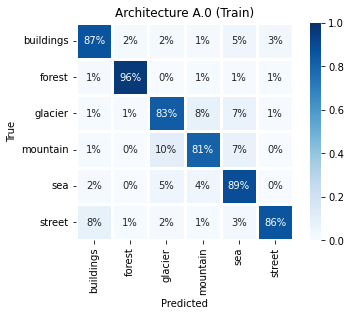

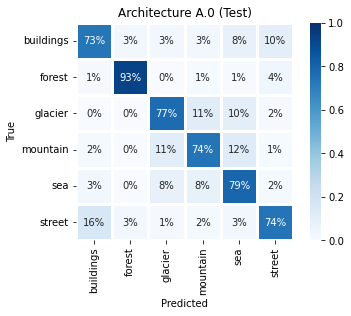

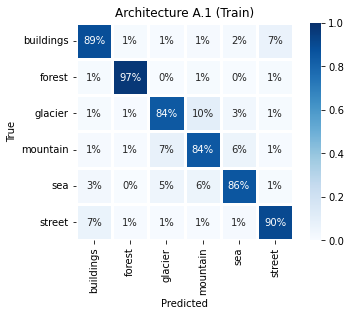

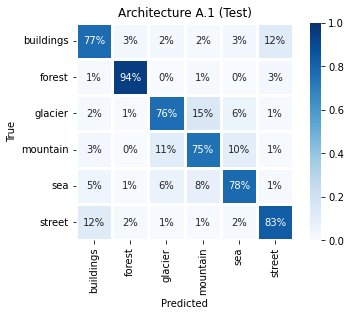

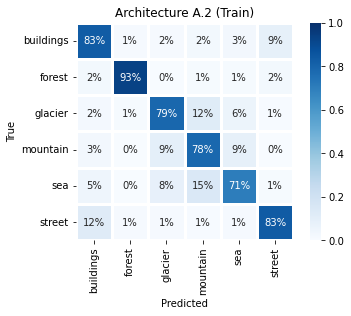

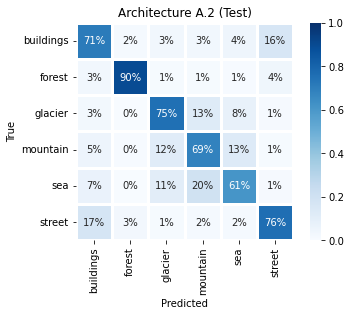

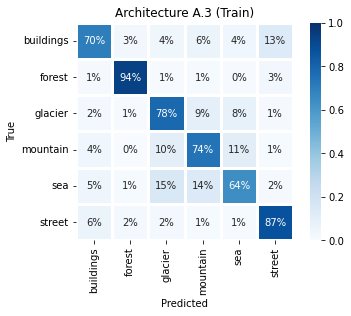

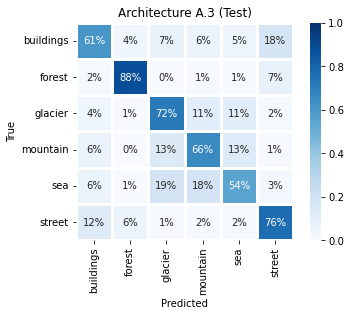

In [53]:
conf_mat_view(train_0, "A.0 (Train)")
conf_mat_view(test_0, "A.0 (Test)")
conf_mat_view(train_1, "A.1 (Train)")
conf_mat_view(test_1, "A.1 (Test)")
conf_mat_view(train_2, "A.2 (Train)")
conf_mat_view(test_2, "A.2 (Test)")
conf_mat_view(train_3, "A.3 (Train)")
conf_mat_view(test_3, "A.3 (Test)")

## Single image

In [18]:
# Best = A.1
name = "1651028035"
best_epoch = 150
param = [12, 5, 3, 2, 2, 24, 3, 3, 2, 2]
h = 200

opt_model = CNN_load(param, h, name, best_epoch)
opt_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 49, 49, 12)        912       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 24, 24, 12)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 24)          2616      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 4, 4, 24)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 384)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 200)               77000     
_________________________________________________________________
dropout_1 (Dropout)          (None, 200)              

buildings


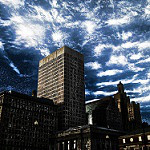

In [83]:
img, img_t = get_img("buildings")
print(class_names[pd.Series(np.ravel(opt_model.predict(img_t))).idxmax()])
img

# Architecture B - Class-by-Class PCA

## PCA

In [15]:
# Best = A.1
name = "1651028035"
best_epoch = 150
param = [12, 5, 3, 2, 2, 24, 3, 3, 2, 2]
h = 200

In [16]:
for cl in class_names:
    generate_flattened_layer_outputs(param, h, name, best_epoch, cl)

Found 2628 images belonging to 1 classes.
(1000, 150, 150, 3)



KeyboardInterrupt



In [30]:
CL0, CL1, CL2, CL3, CL4, CL5 = collect_flattened_layer_outputs("\\Flat\\")

In [31]:
all_data = pd.concat([CL0, CL1, CL2, CL3, CL4, CL5], axis=0)

In [32]:
all_data_corr = all_data.corr()
CL0_corr = CL0.corr()
CL1_corr = CL1.corr()
CL2_corr = CL2.corr()
CL3_corr = CL3.corr()
CL4_corr = CL4.corr()
CL5_corr = CL5.corr()

all_data_corr = all_data_corr.fillna(all_data_corr.mean())
CL0_corr = CL0_corr.fillna(CL0_corr.mean())
CL1_corr = CL1_corr.fillna(CL1_corr.mean())
CL2_corr = CL2_corr.fillna(CL2_corr.mean())
CL3_corr = CL3_corr.fillna(CL3_corr.mean())
CL4_corr = CL4_corr.fillna(CL4_corr.mean())
CL5_corr = CL5_corr.fillna(CL5_corr.mean())

In [33]:
vala, veca = np.linalg.eig(all_data_corr)
val0, vec0 = np.linalg.eig(CL0_corr)
val1, vec1 = np.linalg.eig(CL1_corr)
val2, vec2 = np.linalg.eig(CL2_corr)
val3, vec3 = np.linalg.eig(CL3_corr)
val4, vec4 = np.linalg.eig(CL4_corr)
val5, vec5 = np.linalg.eig(CL5_corr)

In [34]:
PEVA = np.cumsum(vala) / len(vala)
PEV0 = np.cumsum(val0) / len(val0)
PEV1 = np.cumsum(val1) / len(val1)
PEV2 = np.cumsum(val2) / len(val2)
PEV3 = np.cumsum(val3) / len(val3)
PEV4 = np.cumsum(val4) / len(val4)
PEV5 = np.cumsum(val5) / len(val5)
PEV = [PEVA, PEV0, PEV1, PEV2, PEV2, PEV3, PEV4, PEV5]

In [41]:
17034 * 0.8

13627.2

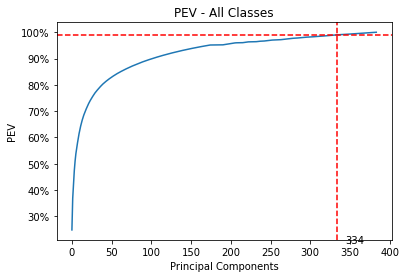

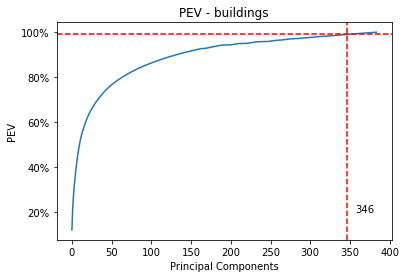

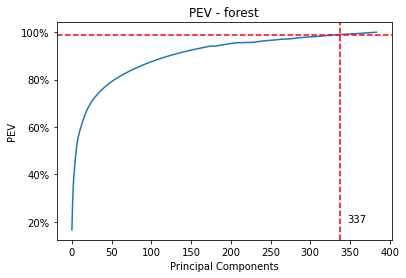

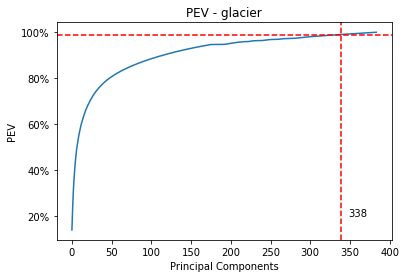

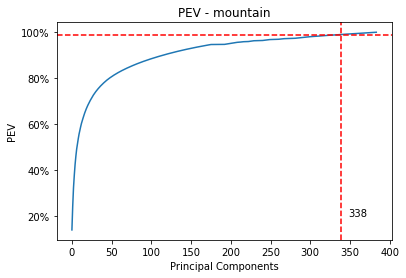

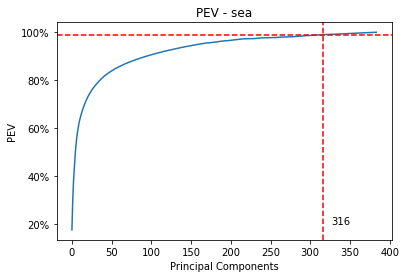

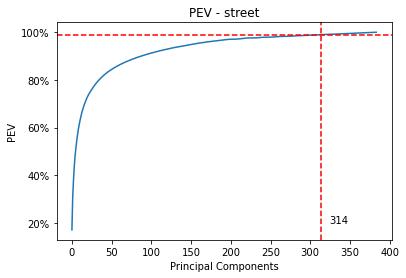

1989


In [40]:
PEV_names = ["All Classes"] + class_names

total_pc = 0
scale_factor = 100
for i, name in enumerate(PEV_names):
    plt.plot(PEV[i] * 100)
    pev_99 = min(np.where(PEV[i] > 0.99)[0])
    if i > 0:
        total_pc += pev_99
    pev_99 = min(np.where(PEV[i] > 0.99)[0])
    plt.title("PEV - " + name)
    plt.xlabel("Principal Components")
    plt.ylabel("PEV")
    plt.axhline(y=99, color="r", linestyle="--")
    plt.axvline(x=pev_99, color="r", linestyle="--")
    plt.text(x=pev_99 + 10, y=20, s=str(pev_99))
    plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter())
    plt.show()

print(total_pc)

## Grid searching

In [10]:
# Define grid of options
h = 2056
parameter_list = [
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [24, 7, 3, 2, 2, 48, 5, 3, 2, 2],
    [24, 7, 3, 2, 2, 48, 5, 3, 2, 2],
    [24, 7, 3, 2, 2, 48, 5, 3, 2, 2],
]
hidden_list = [h] * 6
dropout_list = [0, 0.5, 0.9] * 2

In [11]:
results = dict()
for i, (param, h, d) in enumerate(zip(parameter_list, hidden_list, dropout_list)):
    model = CNN_model(param, h, d)
    model.summary()
    hist = CNN_fit(model)
    results[i] = hist
    df = pd.DataFrame(hist.history)
    df.to_csv("B." + str(i) + ".csv")

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 49, 49, 12)        912       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 24, 24, 12)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 24)          2616      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 4, 4, 24)          0         
_________________________________________________________________
flatten (Flatten)            (None, 384)               0         
_________________________________________________________________
dense (Dense)                (None, 2056)              791560    
_________________________________________________________________
dropout (Dropout)            (None, 2056)              0

## Results

In [15]:
names = [
    "1651073629",
    "1651113795",
    "1651117490",
    "1651080609",
    "1651120971",
    "1651124499",
]
opt_epoch = [75, 100, 195, 50, 50, 100]

In [16]:
train_0, test_0 = CNN_confmat(parameter_list[0], hidden_list[0], names[0], opt_epoch[0])
train_1, test_1 = CNN_confmat(parameter_list[1], hidden_list[1], names[1], opt_epoch[1])
train_2, test_2 = CNN_confmat(parameter_list[2], hidden_list[2], names[2], opt_epoch[2])
train_3, test_3 = CNN_confmat(parameter_list[3], hidden_list[3], names[3], opt_epoch[3])
train_4, test_4 = CNN_confmat(parameter_list[4], hidden_list[4], names[4], opt_epoch[4])
train_5, test_5 = CNN_confmat(parameter_list[5], hidden_list[5], names[5], opt_epoch[5])

Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.


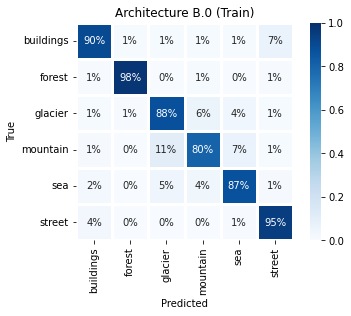

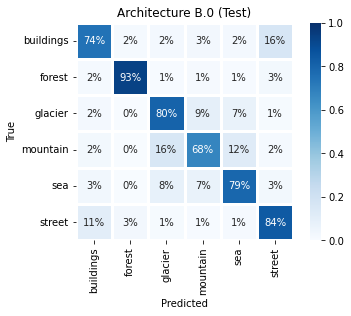

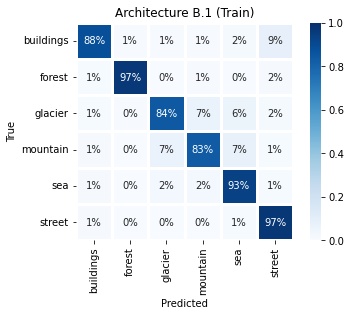

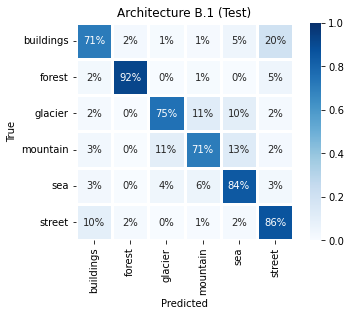

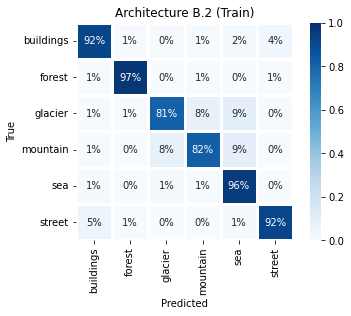

...

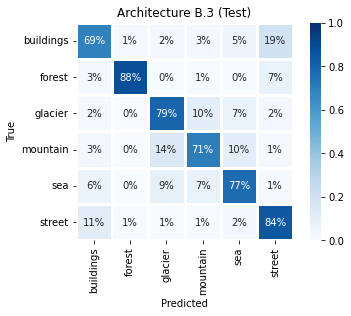

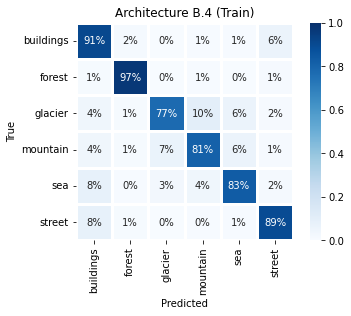

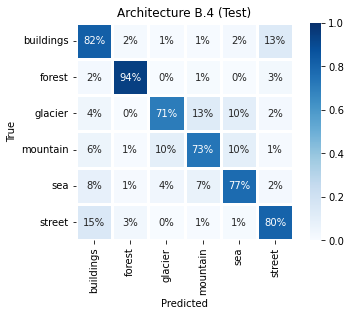

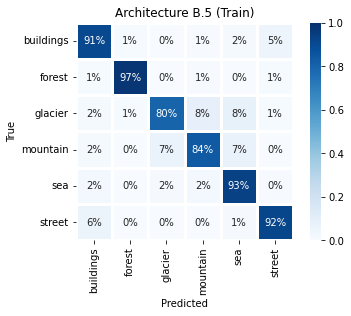

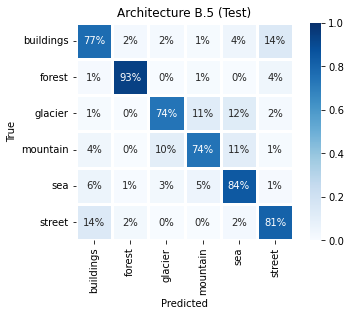

In [14]:
conf_mat_view(train_0, "B.0 (Train)")
conf_mat_view(test_0, "B.0 (Test)")
conf_mat_view(train_1, "B.1 (Train)")
conf_mat_view(test_1, "B.1 (Test)")
conf_mat_view(train_2, "B.2 (Train)")
conf_mat_view(test_2, "B.2 (Test)")
conf_mat_view(train_3, "B.3 (Train)")
conf_mat_view(test_3, "B.3 (Test)")
conf_mat_view(train_4, "B.4 (Train)")
conf_mat_view(test_4, "B.4 (Test)")
conf_mat_view(train_5, "B.5 (Train)")
conf_mat_view(test_5, "B.5 (Test)")

# Error analysis

## Images

Predicted: glacier
True: buildings


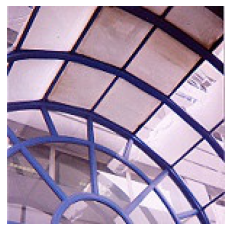

Predicted: sea
True: buildings


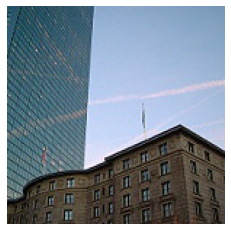

Predicted: sea
True: buildings


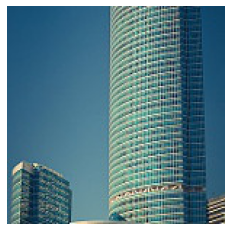

Predicted: street
True: buildings


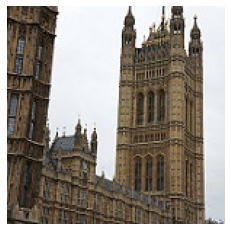

Predicted: glacier
True: buildings


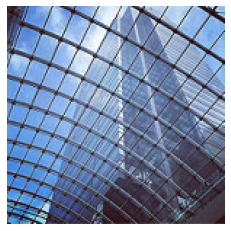

Predicted: street
True: buildings


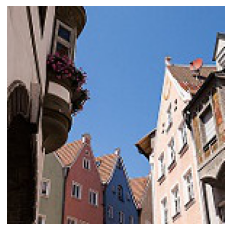

Predicted: sea
True: buildings


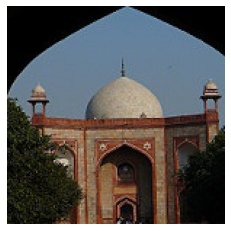

Predicted: street
True: buildings


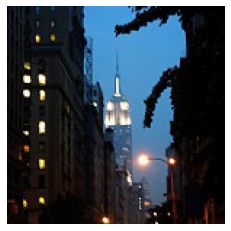

Predicted: forest
True: buildings


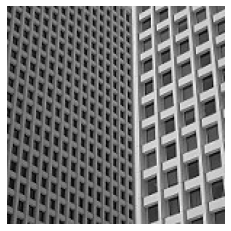

Predicted: forest
True: buildings


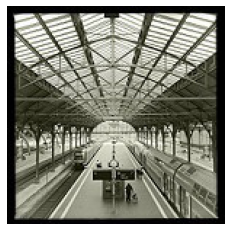

Predicted: street
True: forest


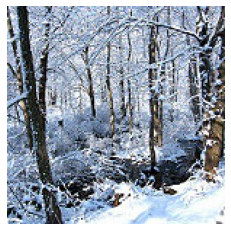

Predicted: sea
True: forest


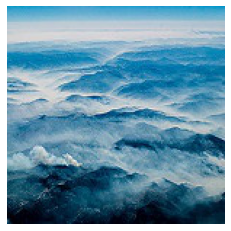

Predicted: mountain
True: forest


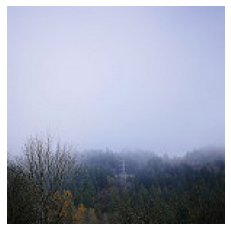

Predicted: street
True: forest


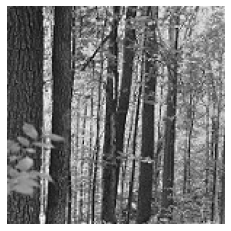

Predicted: mountain
True: forest


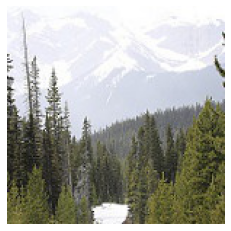

Predicted: mountain
True: forest


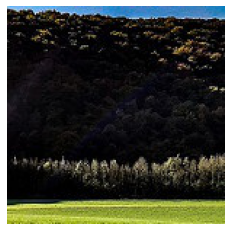

Predicted: buildings
True: forest


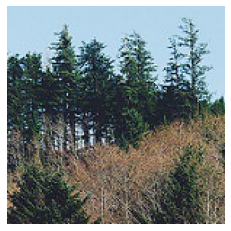

Predicted: street
True: forest


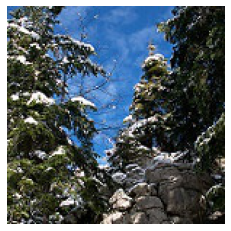

Predicted: buildings
True: forest


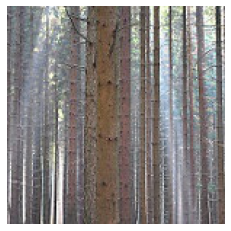

Predicted: buildings
True: forest


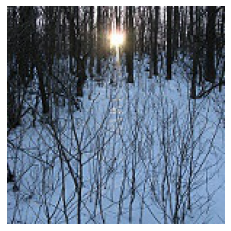

Predicted: mountain
True: glacier


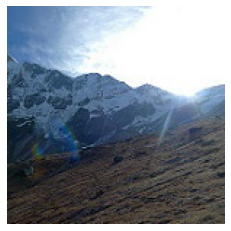

Predicted: sea
True: glacier


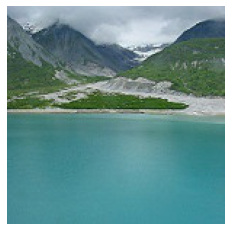

Predicted: sea
True: glacier


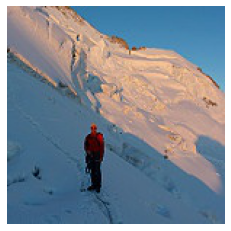

Predicted: mountain
True: glacier


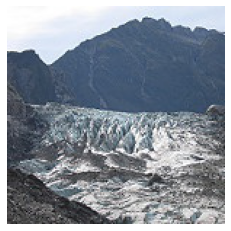

Predicted: mountain
True: glacier


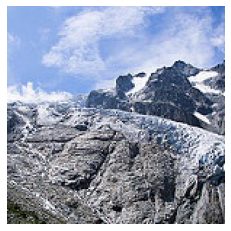

Predicted: sea
True: glacier


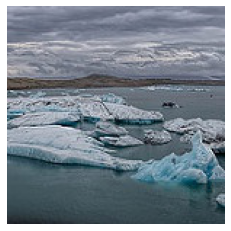

Predicted: mountain
True: glacier


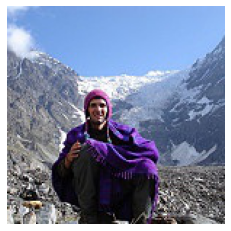

Predicted: sea
True: glacier


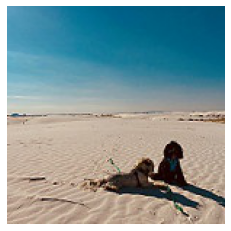

Predicted: sea
True: glacier


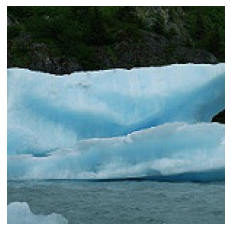

Predicted: sea
True: glacier


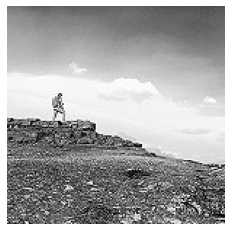

Predicted: sea
True: mountain


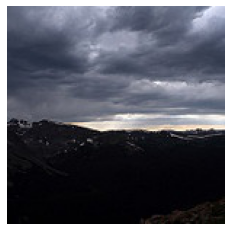

Predicted: sea
True: mountain


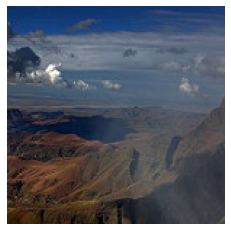

Predicted: sea
True: mountain


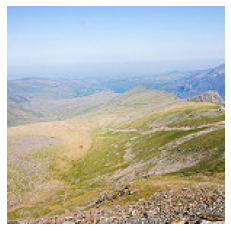

Predicted: buildings
True: mountain


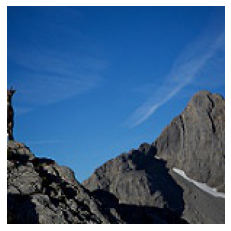

Predicted: glacier
True: mountain


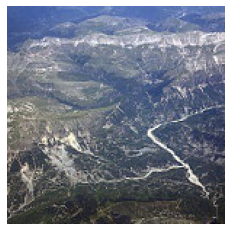

Predicted: glacier
True: mountain


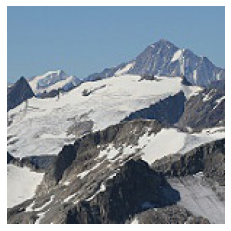

Predicted: sea
True: mountain


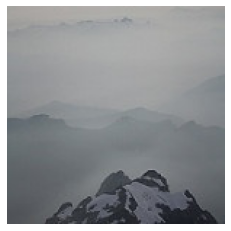

Predicted: glacier
True: mountain


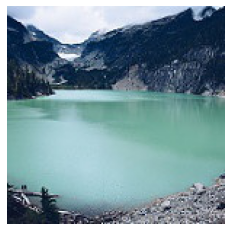

Predicted: sea
True: mountain


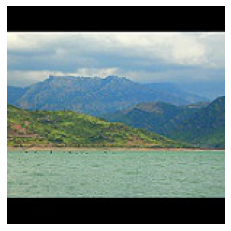

Predicted: sea
True: mountain


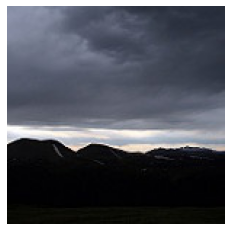

Predicted: buildings
True: sea


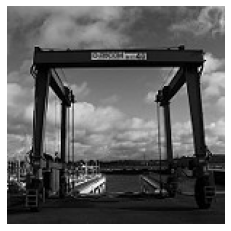

Predicted: mountain
True: sea


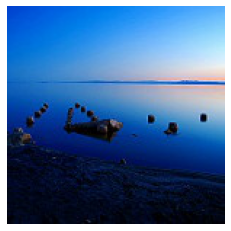

Predicted: glacier
True: sea


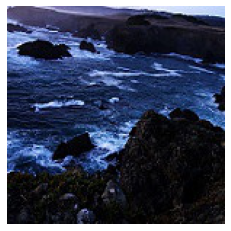

Predicted: glacier
True: sea


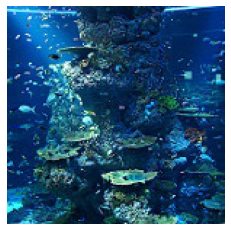

Predicted: glacier
True: sea


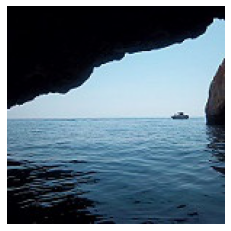

Predicted: glacier
True: sea


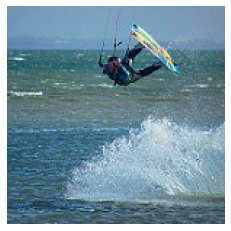

Predicted: buildings
True: sea


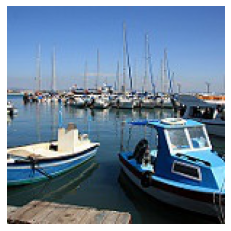

Predicted: mountain
True: sea


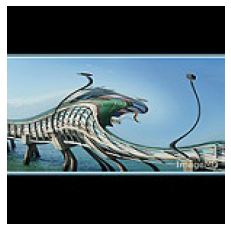

Predicted: mountain
True: sea


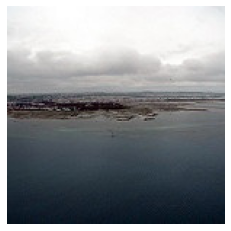

Predicted: buildings
True: sea


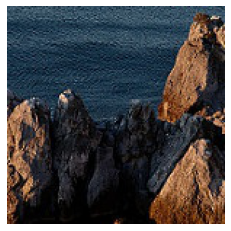

Predicted: buildings
True: street


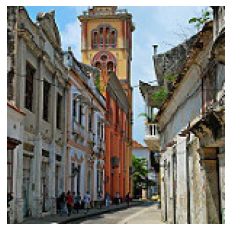

Predicted: buildings
True: street


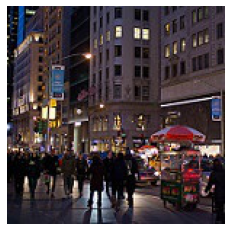

Predicted: sea
True: street


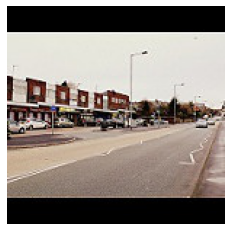

Predicted: buildings
True: street


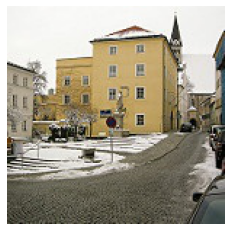

Predicted: buildings
True: street


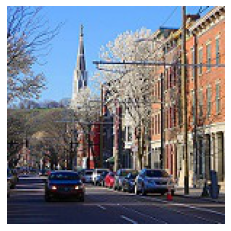

Predicted: buildings
True: street


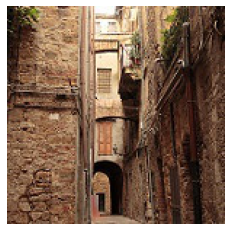

Predicted: buildings
True: street


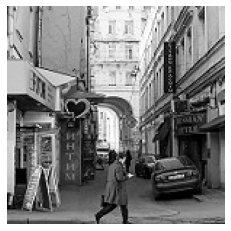

Predicted: buildings
True: street


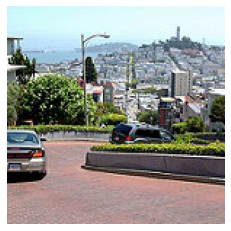

Predicted: mountain
True: street


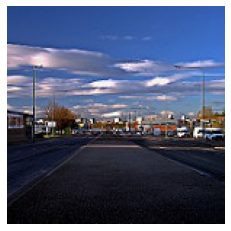

Predicted: buildings
True: street


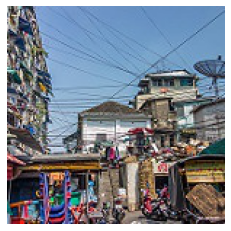

In [40]:
for cl, img in misclassified_results.items():
    labels = misclassified_labels[cl]
    for i, (im, lab) in enumerate(zip(img, labels)):
        if i < 10:
            print("Predicted:", lab)
            print("True:", cl)
            plt.axis("off")
            plt.imshow(im)
            plt.show()

In [19]:
# Best model "B.2"
name = "1651117490"
param = [12, 5, 3, 2, 2, 24, 3, 3, 2, 2]
opt_epoch = 198
h = 2056

opt_model = CNN_load(param, h, name, opt_epoch)
opt_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 49, 49, 12)        912       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 24, 24, 12)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 24)          2616      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 4, 4, 24)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 384)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2056)              791560    
_________________________________________________________________
dropout_1 (Dropout)          (None, 2056)             

In [33]:
misclassified_results = dict()
misclassified_labels = dict()
for cl in class_names:
    img_set = cl_img_split(cl, batch_size=3200)
    misclassified_results[cl], labels = generate_misclassifications(
        opt_model, img_set, cl
    )
    misclassified_labels[cl] = labels

Found 2628 images belonging to 1 classes.
Found 2745 images belonging to 1 classes.
Found 2957 images belonging to 1 classes.
Found 3037 images belonging to 1 classes.
Found 2784 images belonging to 1 classes.
Found 2883 images belonging to 1 classes.


In [57]:
print(round(len(misclassified_labels[class_names[0]]) / 2628, 3) * 100)
print(round(len(misclassified_labels[class_names[1]]) / 2745, 3) * 100)
print(round(len(misclassified_labels[class_names[2]]) / 2957, 3) * 100)
print(round(len(misclassified_labels[class_names[3]]) / 3037, 3) * 100)
print(round(len(misclassified_labels[class_names[4]]) / 2784, 3) * 100)
print(round(len(misclassified_labels[class_names[5]]) / 2883, 3) * 100)

10.2
3.9
20.8
20.1
6.4
10.2


In [ ]:
print(len(misclassified_labels["buildings"]))
print(len(misclassified_labels["forest"]))
print(len(misclassified_labels["glacier"]))
print(len(misclassified_labels["mountain"]))
print(len(misclassified_labels["sea"]))
print(len(misclassified_labels["street"]))

267
106
614
610
177
294


Predicted: glacier
True: buildings


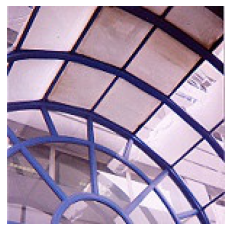

Predicted: sea
True: buildings


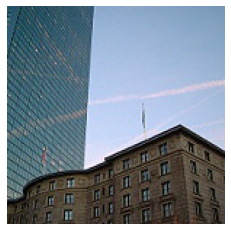

Predicted: sea
True: buildings


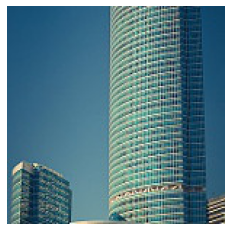

Predicted: street
True: buildings


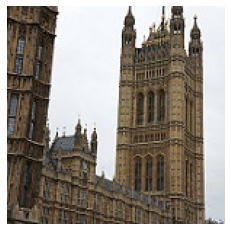

Predicted: glacier
True: buildings


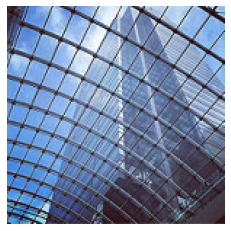

Predicted: street
True: buildings


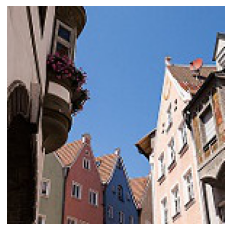

Predicted: sea
True: buildings


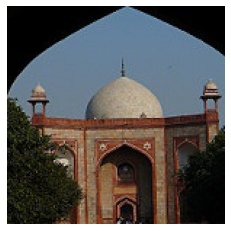

Predicted: street
True: buildings


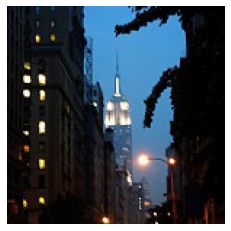

Predicted: forest
True: buildings


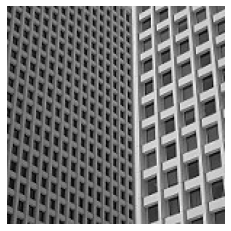

Predicted: forest
True: buildings


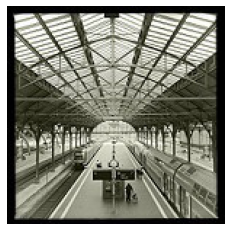

Predicted: street
True: forest


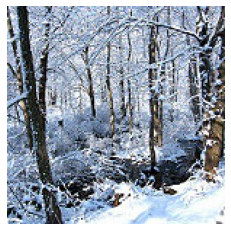

Predicted: sea
True: forest


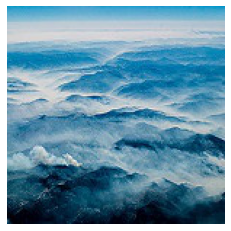

Predicted: mountain
True: forest


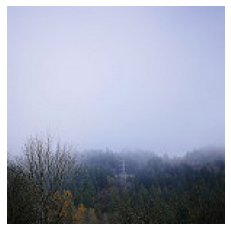

Predicted: street
True: forest


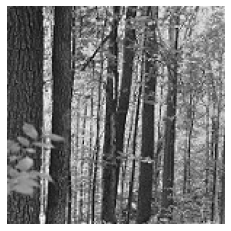

Predicted: mountain
True: forest


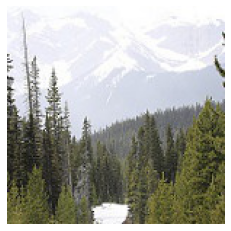

Predicted: mountain
True: forest


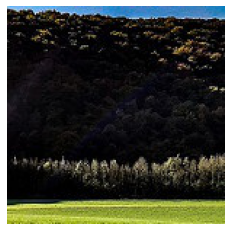

Predicted: buildings
True: forest


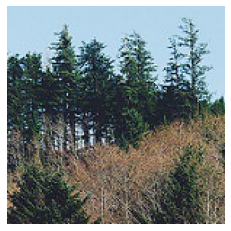

Predicted: street
True: forest


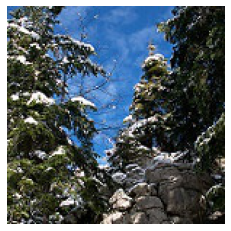

Predicted: buildings
True: forest


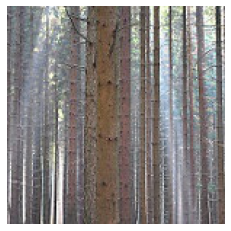

Predicted: buildings
True: forest


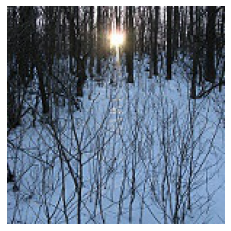

Predicted: mountain
True: glacier


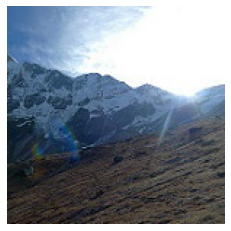

Predicted: sea
True: glacier


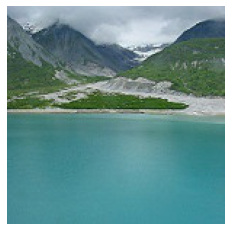

Predicted: sea
True: glacier


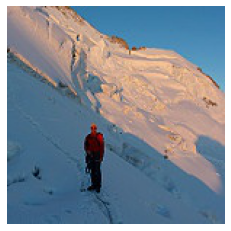

Predicted: mountain
True: glacier


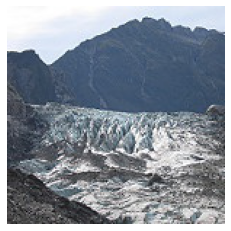

Predicted: mountain
True: glacier


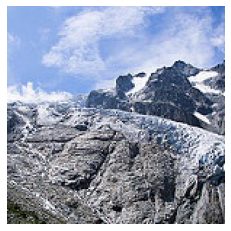

Predicted: sea
True: glacier


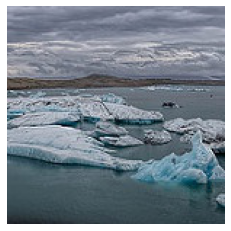

Predicted: mountain
True: glacier


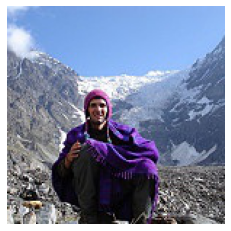

Predicted: sea
True: glacier


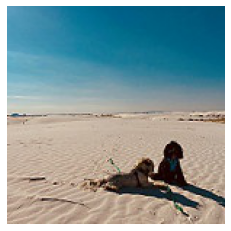

Predicted: sea
True: glacier


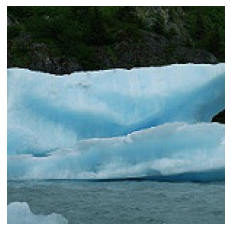

Predicted: sea
True: glacier


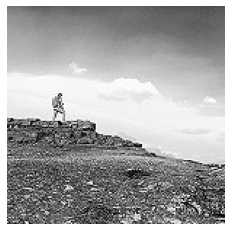

Predicted: sea
True: mountain


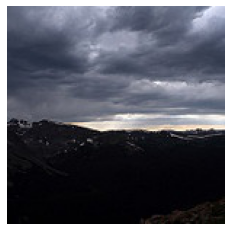

Predicted: sea
True: mountain


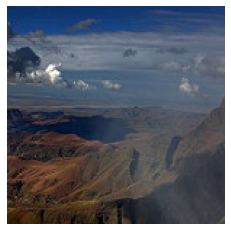

Predicted: sea
True: mountain


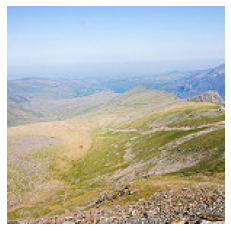

Predicted: buildings
True: mountain


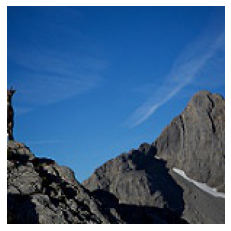

Predicted: glacier
True: mountain


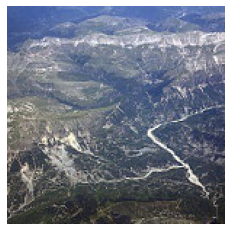

Predicted: glacier
True: mountain


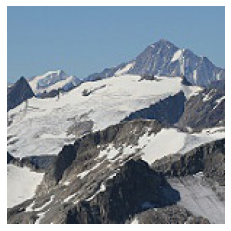

Predicted: sea
True: mountain


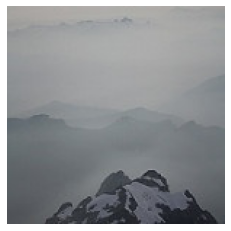

Predicted: glacier
True: mountain


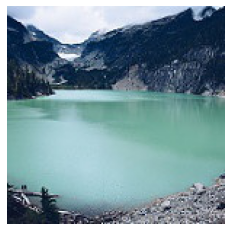

Predicted: sea
True: mountain


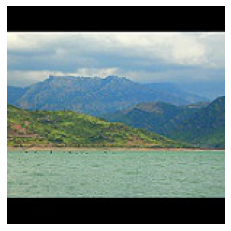

Predicted: sea
True: mountain


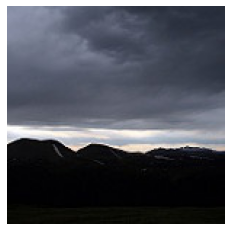

Predicted: buildings
True: sea


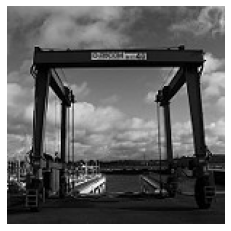

Predicted: mountain
True: sea


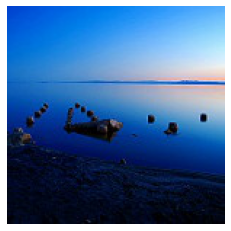

Predicted: glacier
True: sea


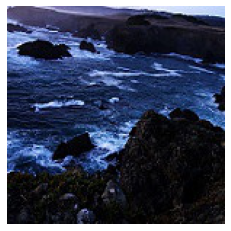

Predicted: glacier
True: sea


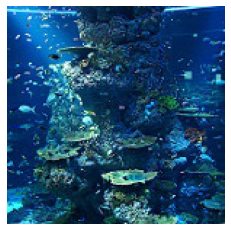

Predicted: glacier
True: sea


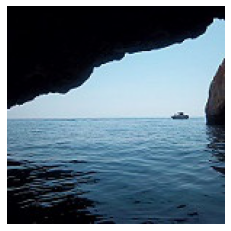

Predicted: glacier
True: sea


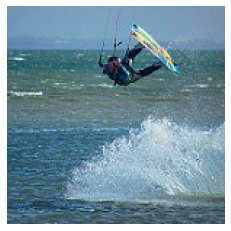

Predicted: buildings
True: sea


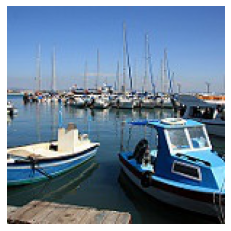

Predicted: mountain
True: sea


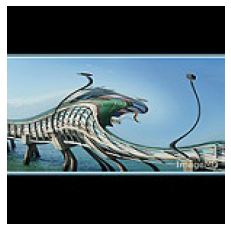

Predicted: mountain
True: sea


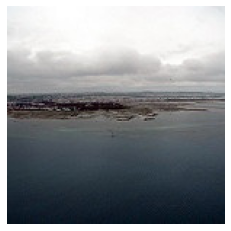

Predicted: buildings
True: sea


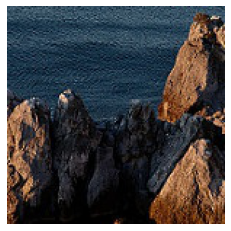

Predicted: buildings
True: street


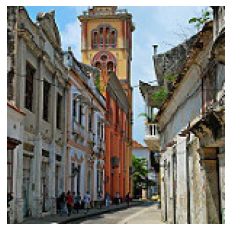

Predicted: buildings
True: street


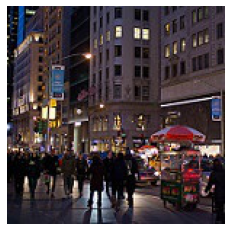

Predicted: sea
True: street


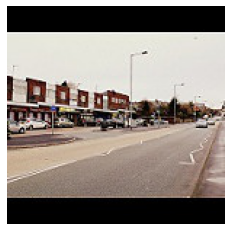

Predicted: buildings
True: street


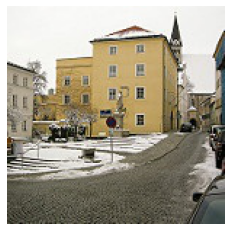

Predicted: buildings
True: street


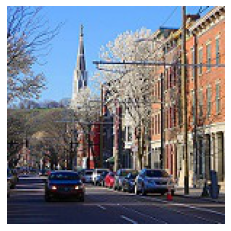

Predicted: buildings
True: street


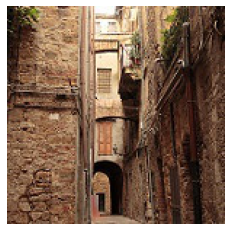

Predicted: buildings
True: street


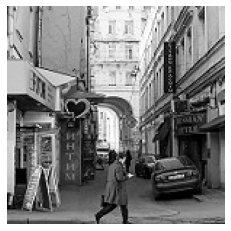

Predicted: buildings
True: street


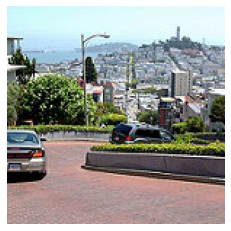

Predicted: mountain
True: street


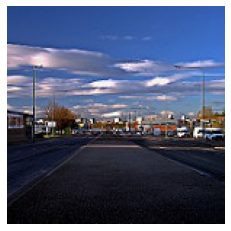

Predicted: buildings
True: street


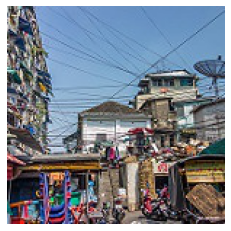

In [40]:
for cl, img in misclassified_results.items():
    labels = misclassified_labels[cl]
    for i, (im, lab) in enumerate(zip(img, labels)):
        if i < 10:
            print("Predicted:", lab)
            print("True:", cl)
            plt.axis("off")
            plt.imshow(im)
            plt.show()

# K-means

In [72]:
# Best model "B.2"
name = "1651117490"
param = [12, 5, 3, 2, 2, 24, 3, 3, 2, 2]
opt_epoch = 198
h = 2056

In [73]:
for cl in class_names:
    generate_flattened_layer_outputs(param, h, name, opt_epoch, cl)

Found 2628 images belonging to 1 classes.
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(628, 150, 150, 3)
Found 2745 images belonging to 1 classes.
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(745, 150, 150, 3)
Found 2957 images belonging to 1 classes.
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(957, 150, 150, 3)
Found 3037 images belonging to 1 classes.
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(37, 150, 150, 3)
Found 2784 images belonging to 1 classes.
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(784, 150, 150, 3)
Found 2883 images belonging to 1 classes.
(1000, 150, 150, 3)
(1000, 150, 150, 3)
(883, 150, 150, 3)


In [74]:
CL0, CL1, CL2, CL3, CL4, CL5 = collect_flattened_layer_outputs("//Flat2//")

In [89]:
pca = PCA(n_components=2)
CL0_pca = pd.DataFrame(pca.fit_transform(CL0), columns=["PC1", "PC2"])
CL1_pca = pd.DataFrame(pca.fit_transform(CL1), columns=["PC1", "PC2"])
CL2_pca = pd.DataFrame(pca.fit_transform(CL2), columns=["PC1", "PC2"])
CL3_pca = pd.DataFrame(pca.fit_transform(CL3), columns=["PC1", "PC2"])
CL4_pca = pd.DataFrame(pca.fit_transform(CL4), columns=["PC1", "PC2"])
CL5_pca = pd.DataFrame(pca.fit_transform(CL5), columns=["PC1", "PC2"])

CL0_pca["Class"] = class_names[0]
CL1_pca["Class"] = class_names[1]
CL2_pca["Class"] = class_names[2]
CL3_pca["Class"] = class_names[3]
CL4_pca["Class"] = class_names[4]
CL5_pca["Class"] = class_names[5]

PC_01 = pd.concat([CL0_pca, CL1_pca])
PC_02 = pd.concat([CL0_pca, CL2_pca])
PC_03 = pd.concat([CL0_pca, CL3_pca])
PC_04 = pd.concat([CL0_pca, CL4_pca])
PC_05 = pd.concat([CL0_pca, CL5_pca])
PC_12 = pd.concat([CL1_pca, CL2_pca])
PC_13 = pd.concat([CL1_pca, CL3_pca])
PC_14 = pd.concat([CL1_pca, CL4_pca])
PC_15 = pd.concat([CL1_pca, CL5_pca])
PC_23 = pd.concat([CL2_pca, CL3_pca])
PC_24 = pd.concat([CL2_pca, CL4_pca])
PC_25 = pd.concat([CL2_pca, CL5_pca])
PC_34 = pd.concat([CL3_pca, CL4_pca])
PC_35 = pd.concat([CL3_pca, CL5_pca])
PC_45 = pd.concat([CL4_pca, CL5_pca])

In [95]:
print(sum(pca.fit(CL0).explained_variance_ratio_))
print(sum(pca.fit(CL1).explained_variance_ratio_))
print(sum(pca.fit(CL2).explained_variance_ratio_))
print(sum(pca.fit(CL3).explained_variance_ratio_))
print(sum(pca.fit(CL4).explained_variance_ratio_))
print(sum(pca.fit(CL5).explained_variance_ratio_))

0.1799946339960608
0.2723176967971298
0.2111507073672791
0.2619634005094178
0.28553998038507944
0.1737050966096067


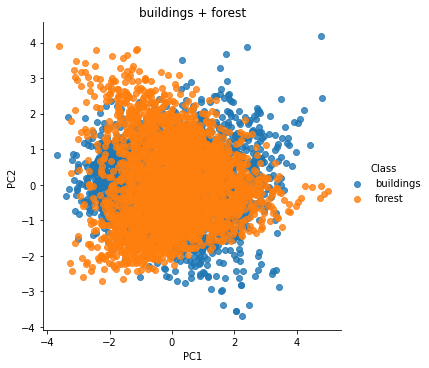

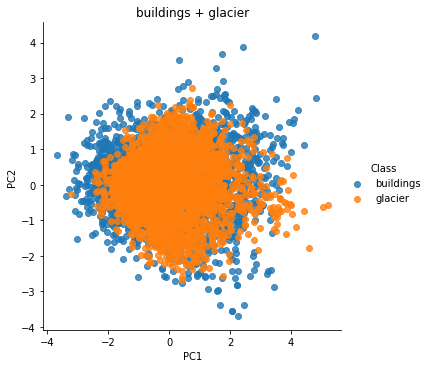

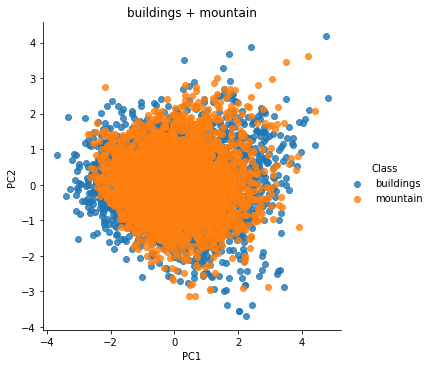

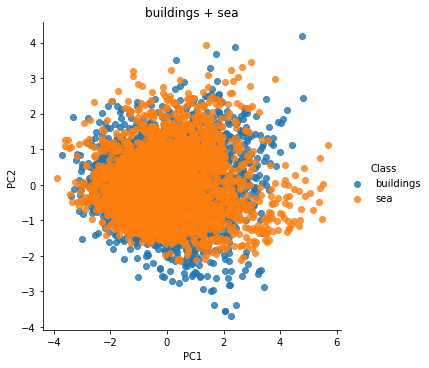

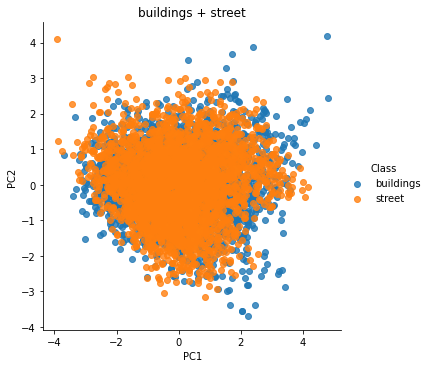

...

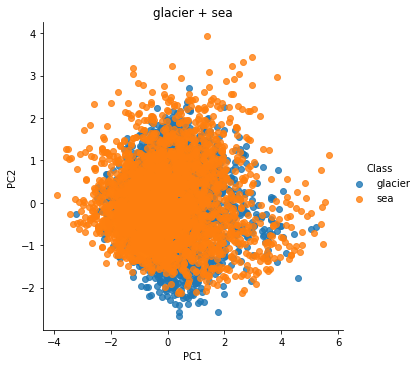

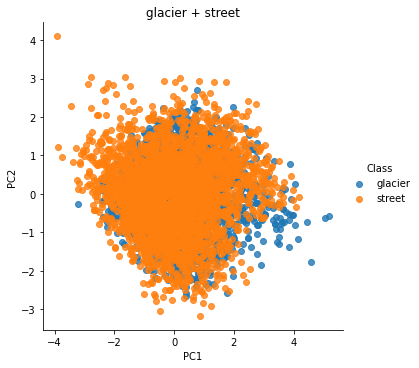

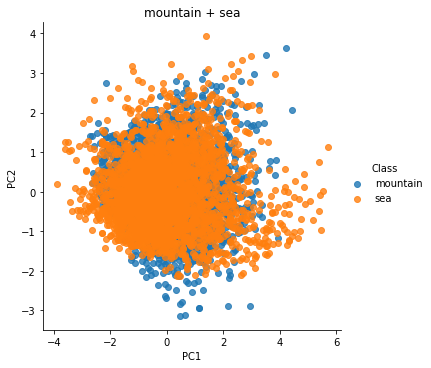

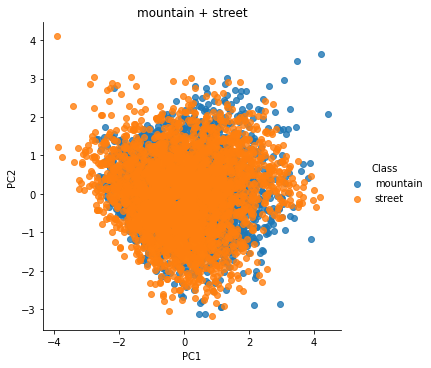

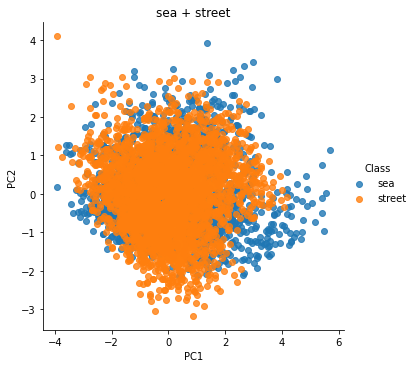

In [88]:
sns.lmplot(x="PC1", y="PC2", data=PC_01, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[0]) + " + " + str(class_names[1]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_02, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[0]) + " + " + str(class_names[2]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_03, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[0]) + " + " + str(class_names[3]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_04, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[0]) + " + " + str(class_names[4]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_05, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[0]) + " + " + str(class_names[5]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_12, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[1]) + " + " + str(class_names[2]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_13, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[1]) + " + " + str(class_names[3]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_14, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[1]) + " + " + str(class_names[4]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_15, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[1]) + " + " + str(class_names[5]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_23, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[2]) + " + " + str(class_names[3]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_24, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[2]) + " + " + str(class_names[4]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_25, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[2]) + " + " + str(class_names[5]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_34, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[3]) + " + " + str(class_names[4]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_35, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[3]) + " + " + str(class_names[5]))
plt.show()

sns.lmplot(x="PC1", y="PC2", data=PC_45, fit_reg=False, hue="Class", legend=True)
plt.title(str(class_names[4]) + " + " + str(class_names[5]))
plt.show()

In [109]:
pca = PCA()
CL0_pca = pca.fit_transform(CL0)
CL1_pca = pca.fit_transform(CL1)
CL2_pca = pca.fit_transform(CL2)
CL3_pca = pca.fit_transform(CL3)
CL4_pca = pca.fit_transform(CL4)
CL5_pca = pca.fit_transform(CL5)

CL0_labels = [0] * CL0_pca.shape[0]
CL1_labels = [1] * CL1_pca.shape[0]
CL2_labels = [2] * CL2_pca.shape[0]
CL3_labels = [3] * CL3_pca.shape[0]
CL4_labels = [4] * CL4_pca.shape[0]
CL5_labels = [5] * CL5_pca.shape[0]

labels = CL0_labels + CL1_labels + CL2_labels + CL3_labels + CL4_labels + CL5_labels

PCA_all = np.concatenate((CL0_pca, CL1_pca, CL2_pca, CL3_pca, CL4_pca, CL5_pca))

In [98]:
PCA_all.shape

(16997, 384)

In [142]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(PCA_all)

KMeans(n_clusters=6)

In [143]:
CL0_pred = pd.Series(kmeans.predict(CL0_pca))
CL1_pred = pd.Series(kmeans.predict(CL1_pca))
CL2_pred = pd.Series(kmeans.predict(CL2_pca))
CL3_pred = pd.Series(kmeans.predict(CL3_pca))
CL4_pred = pd.Series(kmeans.predict(CL4_pca))
CL5_pred = pd.Series(kmeans.predict(CL5_pca))

In [144]:
pd.DataFrame(CL5_pred.value_counts().sort_index())

,0
0,458
1,583
2,344
3,486
4,464
5,548


# Architecture C + D

## Binary CNN - Building + Street

### Grid Search

In [16]:
h = 687
# size buildings 2628
# size street 2883
# Define grid of options
parameter_list = [
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [12, 5, 2, 2, 1, 24, 3, 2, 2, 1],
    [12, 5, 2, 2, 1, 24, 3, 2, 2, 1],
    [12, 5, 2, 2, 1, 24, 3, 2, 2, 1],
]
hidden_list = [h] * 6
dropout_list = [0.5, 0.9, 0.5, 0.9, 0.99]
class_list = ["buildings", "street"]

In [19]:
results = dict()
for i, (param, h, d) in enumerate(zip(parameter_list, hidden_list, dropout_list)):
    if i == 4:
        model = CNN_model(param, h, d, num_outputs=2)
        model.summary()
        hist = CNN_fit(model, num_epochs=300, class_names=class_list)
        results[i] = hist
        df = pd.DataFrame(hist.history)
        df.to_csv("C." + str(i) + ".csv")

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 73, 73, 12)        912       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 72, 72, 12)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 35, 35, 24)        2616      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 34, 34, 24)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 27744)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 687)               19060815  
_________________________________________________________________
dropout_1 (Dropout)          (None, 687)              

### Results

In [29]:
names = ["1651234036", "1651235799", "1651237793", "1651239933", "1651246430"]
opt_epoch = [75, 175, 25, 50, 50, 275]
cl = ["buildings", "street"]

In [30]:
train_0, test_0 = CNN_confmat(
    parameter_list[0],
    hidden_list[0],
    names[0],
    opt_epoch[0],
    num_outputs=2,
    class_names=cl,
)
train_1, test_1 = CNN_confmat(
    parameter_list[1],
    hidden_list[1],
    names[1],
    opt_epoch[1],
    num_outputs=2,
    class_names=cl,
)
train_2, test_2 = CNN_confmat(
    parameter_list[2],
    hidden_list[2],
    names[2],
    opt_epoch[2],
    num_outputs=2,
    class_names=cl,
)
train_3, test_3 = CNN_confmat(
    parameter_list[3],
    hidden_list[3],
    names[3],
    opt_epoch[3],
    num_outputs=2,
    class_names=cl,
)
train_4, test_4 = CNN_confmat(
    parameter_list[4],
    hidden_list[4],
    names[4],
    opt_epoch[4],
    num_outputs=2,
    class_names=cl,
)

Found 4410 images belonging to 2 classes.
Found 1101 images belonging to 2 classes.
Found 4410 images belonging to 2 classes.
Found 1101 images belonging to 2 classes.
Found 4410 images belonging to 2 classes.
Found 1101 images belonging to 2 classes.
Found 4410 images belonging to 2 classes.
Found 1101 images belonging to 2 classes.
Found 4410 images belonging to 2 classes.
Found 1101 images belonging to 2 classes.


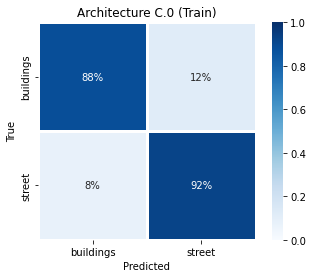

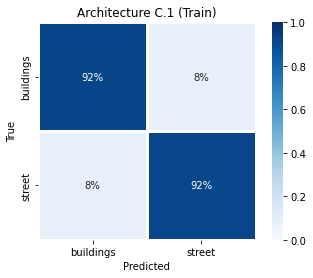

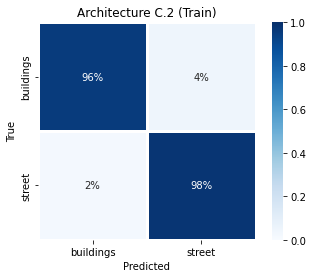

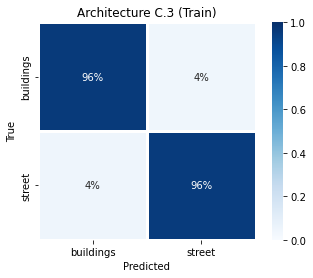

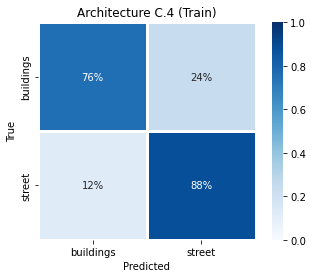

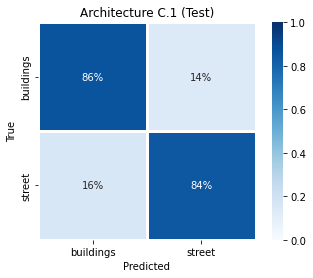

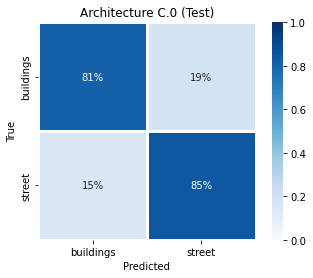

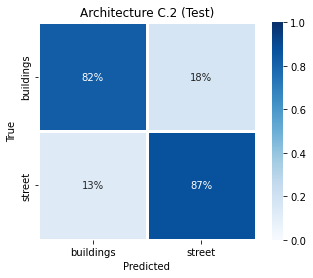

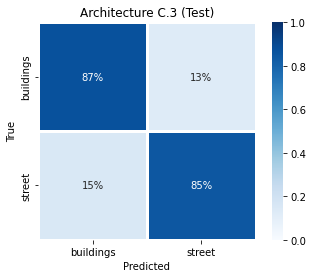

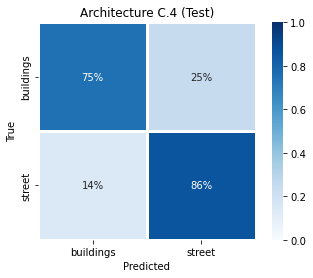

In [32]:
conf_mat_view(train_0, "C.0 (Train)", class_names=cl)
conf_mat_view(train_1, "C.1 (Train)", class_names=cl)
conf_mat_view(train_2, "C.2 (Train)", class_names=cl)
conf_mat_view(train_3, "C.3 (Train)", class_names=cl)
conf_mat_view(train_4, "C.4 (Train)", class_names=cl)

conf_mat_view(test_1, "C.1 (Test)", class_names=cl)
conf_mat_view(test_0, "C.0 (Test)", class_names=cl)
conf_mat_view(test_2, "C.2 (Test)", class_names=cl)
conf_mat_view(test_3, "C.3 (Test)", class_names=cl)
conf_mat_view(test_4, "C.4 (Test)", class_names=cl)

## Binary CNN - Glacier + Mountain

### Grid search

In [48]:
h = 684
# size buildings 2628
# size street 2883
# Define grid of options
parameter_list = [
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [12, 5, 2, 2, 1, 24, 3, 2, 2, 1],
]
hidden_list = [h] * 2
dropout_list = [0.9] * 2
class_list = ["glacier", "mountain"]

In [49]:
results = dict()
for i, (param, h, d) in enumerate(zip(parameter_list, hidden_list, dropout_list)):
    model = CNN_model(param, h, d, num_outputs=2)
    model.summary()
    hist = CNN_fit(model, num_epochs=200, class_names=class_list)
    results[i] = hist
    df = pd.DataFrame(hist.history)
    df.to_csv("D." + str(i) + ".csv")

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_40 (Conv2D)           (None, 49, 49, 12)        912       
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 24, 24, 12)        0         
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 8, 8, 24)          2616      
_________________________________________________________________
max_pooling2d_41 (MaxPooling (None, 4, 4, 24)          0         
_________________________________________________________________
flatten_20 (Flatten)         (None, 384)               0         
_________________________________________________________________
dense_40 (Dense)             (None, 684)               263340    
_________________________________________________________________
dropout_20 (Dropout)         (None, 684)             

In [57]:
pd.DataFrame(results[0].history).to_csv("D.0.csv")
pd.DataFrame(results[1].history).to_csv("D.1.csv")

### Results

In [58]:
names = ["1651256417", "1651257655"]
opt_epoch = [180, 72]
cl = ["glacier", "mountain"]

In [59]:
train_0, test_0 = CNN_confmat(
    parameter_list[0],
    hidden_list[0],
    names[0],
    opt_epoch[0],
    num_outputs=2,
    class_names=cl,
)
train_1, test_1 = CNN_confmat(
    parameter_list[1],
    hidden_list[1],
    names[1],
    opt_epoch[1],
    num_outputs=2,
    class_names=cl,
)

Found 4796 images belonging to 2 classes.
Found 1198 images belonging to 2 classes.
Found 4796 images belonging to 2 classes.
Found 1198 images belonging to 2 classes.


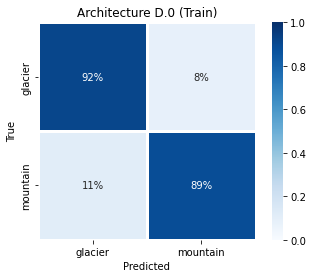

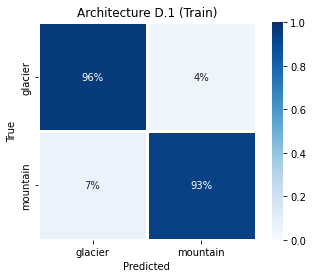

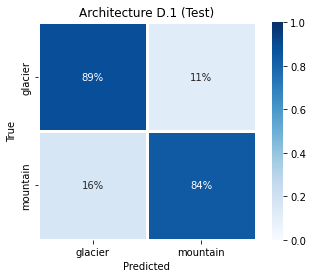

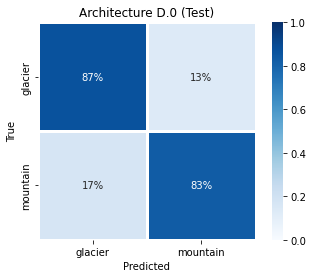

In [60]:
conf_mat_view(train_0, "D.0 (Train)", class_names=cl)
conf_mat_view(train_1, "D.1 (Train)", class_names=cl)
conf_mat_view(test_1, "D.1 (Test)", class_names=cl)
conf_mat_view(test_0, "D.0 (Test)", class_names=cl)

## Optimized Model Implementation

In [25]:
# B.2, C.3, D.1
class_names = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
names = ["1651117490", "1651239933", "1651257655"]
opt_epoch = [198, 50, 50]
parameter_list = [
    [12, 5, 3, 2, 2, 24, 3, 3, 2, 2],
    [12, 5, 2, 2, 1, 24, 3, 2, 2, 1],
    [12, 5, 2, 2, 1, 24, 3, 2, 2, 1],
]

hidden_list = [2056, 687, 684]
dropout_list = [0.9] * 3

In [26]:
model_1 = CNN_load(
    parameter_list[0], hidden_list[0], names[0], opt_epoch[0], num_outputs=6
)
model_2 = CNN_load(
    parameter_list[1], hidden_list[1], names[1], opt_epoch[1], num_outputs=2
)
model_3 = CNN_load(
    parameter_list[2], hidden_list[2], names[2], opt_epoch[2], num_outputs=2
)

In [68]:
def multi_model_bootstrap_predict(model_1, model_2, model_3, n_boot = 50):
    y_pred_total = list()
    y_true_total = list()
    for boot in range(n_boot):
        train, test = img_split(shuffle = True)
        for images,labels in next(zip(train)):
            for i in range(100):
                img = np.expand_dims(images[i], axis = 0)
                y_pred = np.argmax(model_1.predict(img), axis = 1)
                if y_pred == (0 or 5): # buildings or street
                    y_pred = np.argmax(model_2.predict(img), axis = 1) * 5
                elif y_pred == (2 or 3): # glacier or mountain
                    y_pred = np.argmax(model_3.predict(img), axis = 1) + 2
                y_pred_total.append(int(y_pred))
                y_true_total.append(int(np.argmax(labels[i])))
        
    return(y_pred_total, y_true_total)

In [69]:
y_pred, y_true = multi_model_bootstrap_predict(model_1, model_2, model_3)

Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belo

In [78]:
sum(y_pred_np == y_true_np)/len(y_pred)

0.8966

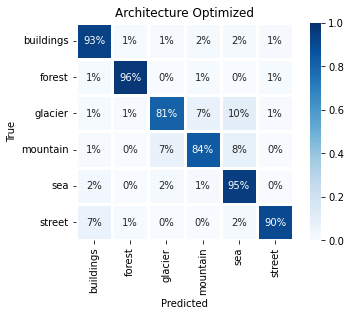

In [81]:
conf_mat_view(confusion_matrix(y_true_np, y_pred_np, normalize="true"), "Optimized")

In [93]:
np.std([93,96,81,84,95,90])/np.sqrt(5000)

0.07891627067834477

In [82]:
# Original model - bootstrap approach
y_pred_total2 = list()
y_true_total2 = list()
for boot in range(50):
    train, test = img_split(shuffle = True)
    for images,labels in next(zip(train)):
        for i in range(100):
            img = np.expand_dims(images[i], axis = 0)
            y_pred = np.argmax(model_1.predict(img), axis = 1)
            y_pred_total2.append(int(y_pred))
            y_true_total2.append(int(np.argmax(labels[i])))
            

Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belonging to 6 classes.
Found 13630 images belonging to 6 classes.
Found 3404 images belo

In [84]:
y_pred_total2_np = np.array(y_pred_total2)
y_true_total2_np = np.array(y_true_total2)
print(len(y_pred_total2))
global_acc_B2 = sum(y_true_total2_np == y_pred_total2_np)/len(y_pred_total2)
print(global_acc_B2)

5000
0.8984


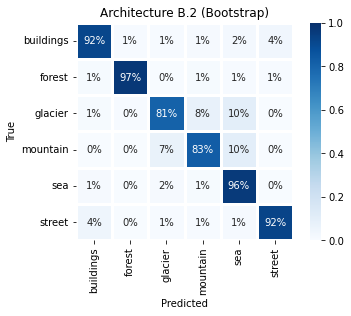

In [86]:
conf_mat_view(confusion_matrix(y_true_total2_np, y_pred_total2_np, normalize="true"), "B.2 (Bootstrap)")

In [94]:
np.std([92,97,81,83,96,92])/np.sqrt(5000)

0.08618455649231929